In [1]:
!git clone https://github.com/Shubhamkumar-op/VisionDrive.git

Cloning into 'VisionDrive'...
remote: Enumerating objects: 15831, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 15831 (delta 0), reused 4 (delta 0), pack-reused 15827 (from 1)
Receiving objects: 100% (15831/15831), 233.16 MiB | 19.39 MiB/s, done.
Updating files: 100% (15825/15825), done.


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [3]:
datadir = '/content/VisionDrive/data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,D:\simulator-windows-64\data\IMG\center_2024_08_12_19_10_32_463.jpg,D:\simulator-windows-64\data\IMG\left_2024_08_12_19_10_32_463.jpg,D:\simulator-windows-64\data\IMG\right_2024_08_12_19_10_32_463.jpg,0.0,0.0,0.0,0.000078
1,D:\simulator-windows-64\data\IMG\center_2024_08_12_19_10_32_567.jpg,D:\simulator-windows-64\data\IMG\left_2024_08_12_19_10_32_567.jpg,D:\simulator-windows-64\data\IMG\right_2024_08_12_19_10_32_567.jpg,0.0,0.0,0.0,0.000079
2,D:\simulator-windows-64\data\IMG\center_2024_08_12_19_10_32_671.jpg,D:\simulator-windows-64\data\IMG\left_2024_08_12_19_10_32_671.jpg,D:\simulator-windows-64\data\IMG\right_2024_08_12_19_10_32_671.jpg,0.0,0.0,0.0,0.000078
3,D:\simulator-windows-64\data\IMG\center_2024_08_12_19_10_32_773.jpg,D:\simulator-windows-64\data\IMG\left_2024_08_12_19_10_32_773.jpg,D:\simulator-windows-64\data\IMG\right_2024_08_12_19_10_32_773.jpg,0.0,0.0,0.0,0.000078
4,D:\simulator-windows-64\data\IMG\center_2024_08_12_19_10_32_879.jpg,D:\simulator-windows-64\data\IMG\left_2024_08_12_19_10_32_879.jpg,D:\simulator-windows-64\data\IMG\right_2024_08_12_19_10_32_879.jpg,0.0,0.0,0.0,0.000078


In [4]:
def path_remove(path):
  head,tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_remove)
data['left'] = data['left'].apply(path_remove)
data['right'] = data['right'].apply(path_remove)

In [5]:
data.head(10)

,center,left,right,steering,throttle,reverse,speed
0,center_2024_08_12_19_10_32_463.jpg,left_2024_08_12_19_10_32_463.jpg,right_2024_08_12_19_10_32_463.jpg,0.0,0.0,0.0,0.000078
1,center_2024_08_12_19_10_32_567.jpg,left_2024_08_12_19_10_32_567.jpg,right_2024_08_12_19_10_32_567.jpg,0.0,0.0,0.0,0.000079
2,center_2024_08_12_19_10_32_671.jpg,left_2024_08_12_19_10_32_671.jpg,right_2024_08_12_19_10_32_671.jpg,0.0,0.0,0.0,0.000078
3,center_2024_08_12_19_10_32_773.jpg,left_2024_08_12_19_10_32_773.jpg,right_2024_08_12_19_10_32_773.jpg,0.0,0.0,0.0,0.000078
4,center_2024_08_12_19_10_32_879.jpg,left_2024_08_12_19_10_32_879.jpg,right_2024_08_12_19_10_32_879.jpg,0.0,0.0,0.0,0.000078
5,center_2024_08_12_19_10_32_984.jpg,left_2024_08_12_19_10_32_984.jpg,right_2024_08_12_19_10_32_984.jpg,0.0,0.0,0.0,0.000080
6,center_2024_08_12_19_10_33_091.jpg,left_2024_08_12_19_10_33_091.jpg,right_2024_08_12_19_10_33_091.jpg,0.0,0.0,0.0,0.000078
7,center_2024_08_12_19_10_33_196.jpg,left_2024_08_12_19_10_33_196.jpg,right_2024_08_12_19_10_33_196.jpg,0.0,0.0,0.0,0.000080
8,center_2024_08_12_19_10_33_302.jpg,left_2024_08_12_19_10_33_302.jpg,right_2024_08_12_19_10_33_302.jpg,0.0,0.0,0.0,0.000079
9,center_2024_08_12_19_10_33_406.jpg,left_2024_08_12_19_10_33_406.jpg,right_2024_08_12_19_10_33_406.jpg,0.0,0.0,0.0,0.000080


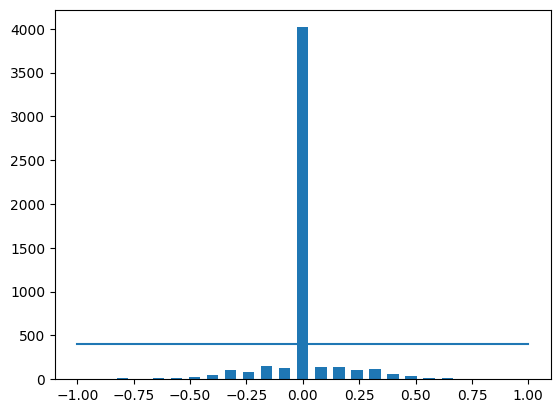

In [6]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

If we pass the above data then our model will be bais toward 0 means centre so wew have to remove the unwanted data

In [7]:
data.shape

(5274, 7)

In [8]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 3616
remaining: 1658


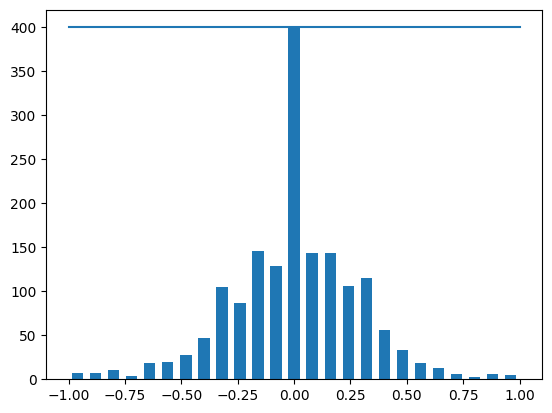

In [9]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

Converting raw Images to Numpy array format

In [10]:
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(df)):
        indexed_data = df.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data[3]) + 0.15)
        # right image append
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data[3]) - 0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings


In [11]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

<ipython-input-10-8bf25e851f3a>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-10-8bf25e851f3a>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-10-8bf25e851f3a>:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]) + 0.15)
<ipython-input-10-8bf25e851f3a>:1

In [12]:
image_paths[:10]

array(['/content/VisionDrive/data/IMG/center_2024_08_12_19_10_32_984.jpg',
       '/content/VisionDrive/data/IMG/left_2024_08_12_19_10_32_984.jpg',
       '/content/VisionDrive/data/IMG/right_2024_08_12_19_10_32_984.jpg',
       '/content/VisionDrive/data/IMG/center_2024_08_12_19_10_33_615.jpg',
       '/content/VisionDrive/data/IMG/left_2024_08_12_19_10_33_615.jpg',
       '/content/VisionDrive/data/IMG/right_2024_08_12_19_10_33_615.jpg',
       '/content/VisionDrive/data/IMG/center_2024_08_12_19_10_34_559.jpg',
       '/content/VisionDrive/data/IMG/left_2024_08_12_19_10_34_559.jpg',
       '/content/VisionDrive/data/IMG/right_2024_08_12_19_10_34_559.jpg',
       '/content/VisionDrive/data/IMG/center_2024_08_12_19_10_34_662.jpg'],
      dtype='<U64')

In [13]:
steerings[:10]

array([ 0.       ,  0.15     , -0.15     ,  0.       ,  0.15     ,
       -0.15     , -0.1739208, -0.0239208, -0.3239208, -0.4356321])

In [14]:
len(image_paths)

4974

In [15]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=42)

In [16]:
X_train.shape

(3979,)

Text(0.5, 1.0, 'Zoomed Image')

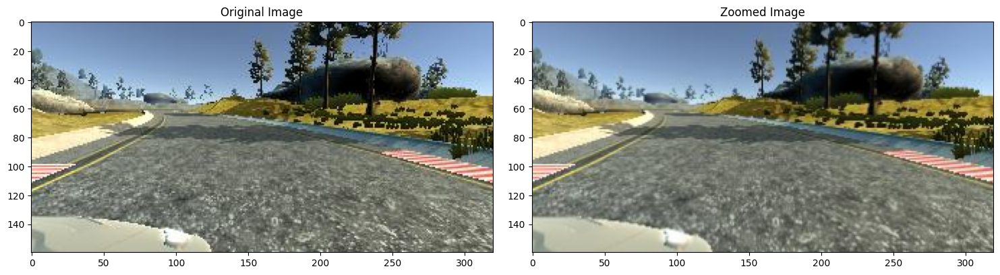

In [17]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

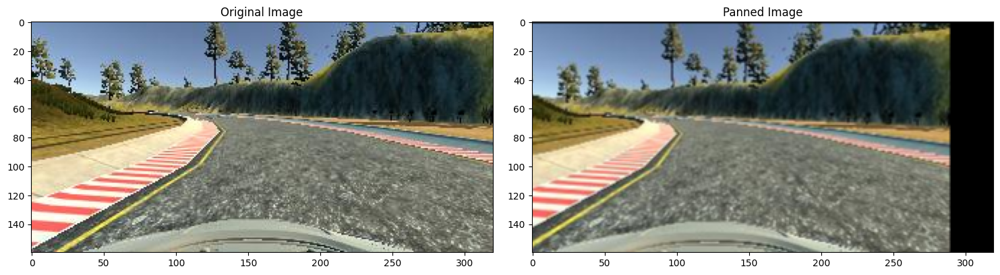

In [18]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

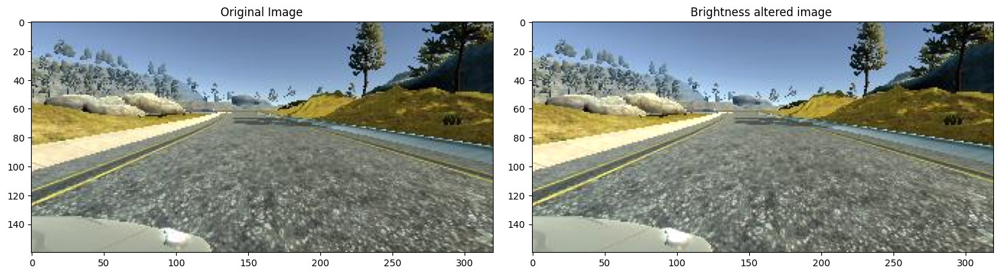

In [19]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.4549647')

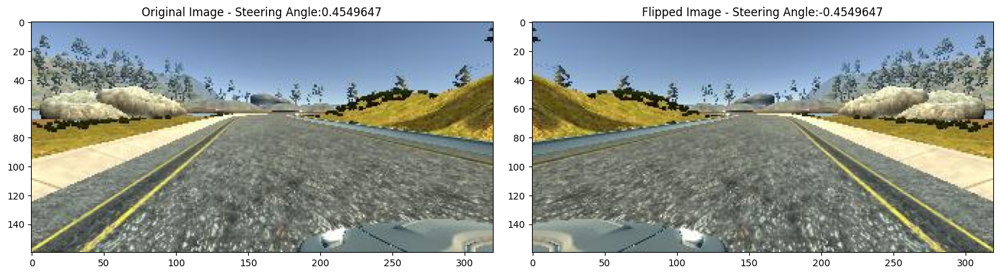

In [20]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [21]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle

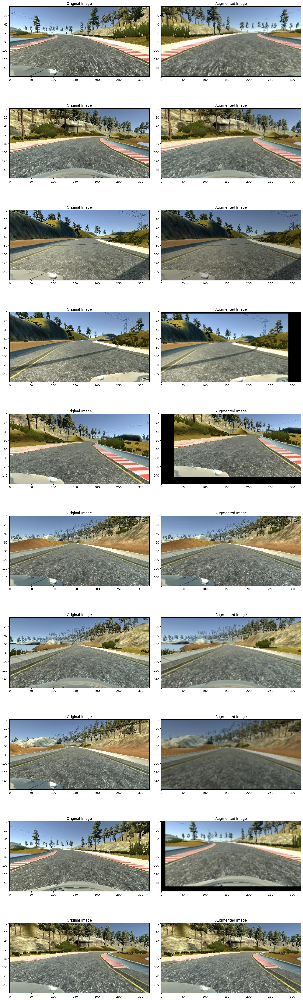

In [22]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [23]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

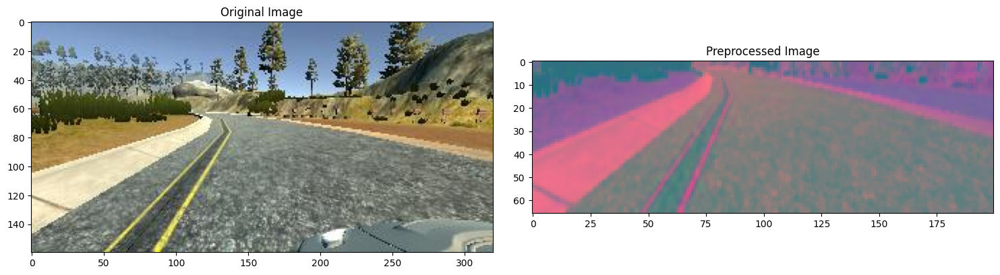

In [24]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [25]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [26]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

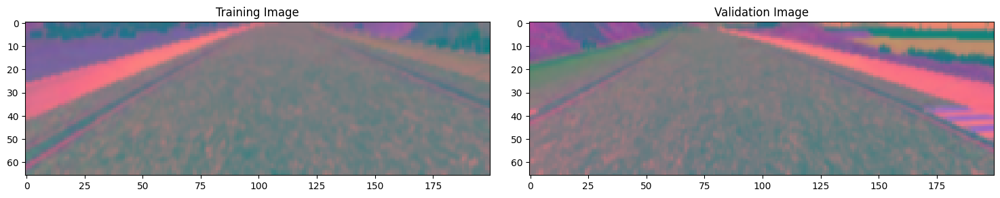

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [31]:
# def model():
#   model = Sequential()
#   model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
#   model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
#   model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
#   model.add(Conv2D(64, (5, 5), activation='elu'))
#   model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


#   model.add(Flatten())

#   model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

#   model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

#   model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

#   model.add(Dense(1))

#   optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
#   model.compile(loss='mse', optimizer=optimizer)
#   return model

# model = model()
# print(model.summary())

In [30]:
def model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))

    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))

    model.add(Dropout(0.5))
    model.add(Flatten())

    model.add(Dense(100, activation='elu'))
    model.add(Dropout(0.5))

    model.add(Dense(50, activation='elu'))
    model.add(Dropout(0.5))

    model.add(Dense(10, activation='elu'))
    model.add(Dropout(0.5))

    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)

    return model

model = model()
print(model.summary())

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 3, 20, 64)           │          27,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 1, 18, 64)           │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1, 18, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 10)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [33]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 141s 434ms/step - loss: 0.2428 - val_loss: 0.0770
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 125s 417ms/step - loss: 0.0862 - val_loss: 0.0672
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 126s 423ms/step - loss: 0.0814 - val_loss: 0.0649
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 127s 426ms/step - loss: 0.0791 - val_loss: 0.0646
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 126s 423ms/step - loss: 0.0784 - val_loss: 0.0605
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 129s 433ms/step - loss: 0.0769 - val_loss: 0.0635
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 118s 394ms/step - loss: 0.0725 - val_loss: 0.0660
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 121s 405ms/step - loss: 0.0739 - val_loss: 0.0640
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 120s 403ms/step - loss: 0.0737 - val_loss: 0.0595
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 120s 401ms/step - loss: 0.0739 - val_loss: 0.0603


Text(0.5, 0, 'Epoch')

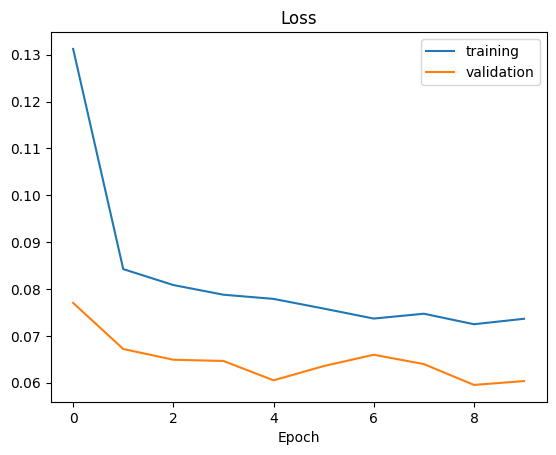

In [34]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [35]:
model.save('model.h5')

In [36]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>